In [1]:
import pickle
import numpy as np
import json 
from collections import defaultdict

import matplotlib.pyplot as plt
%matplotlib inline

import networkx as nx
from networkx.algorithms import community

import pquality
import cdlib
from cdlib import evaluation
from cdlib import algorithms
from cdlib import viz
from cdlib import ensemble
from cdlib import readwrite

C:\Users\valen\PYTHON_3.7\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
def get_list_of_tuples_from_NodeClustering(coms):
    return [tuple(x) for x in coms.communities]

In [3]:
G = nx.read_edgelist('network.csv', data=(('weight', int),('industry',int)) , delimiter=",")

In [4]:
with open('louvain.pickle', 'rb') as f:
    coms_louv = pickle.load(f)

In [5]:
coms_louv_tuple = get_list_of_tuples_from_NodeClustering(coms_louv)
len(coms_louv_tuple)

785

In [6]:
print(coms_louv.method_parameters)

{'weight': 'weight', 'resolution': 0.8, 'randomize': False}


# Communities

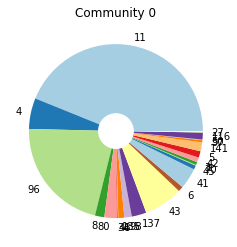

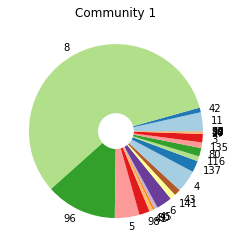

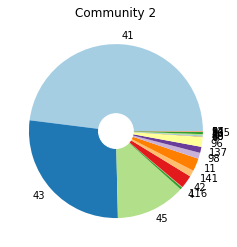

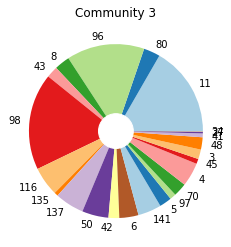

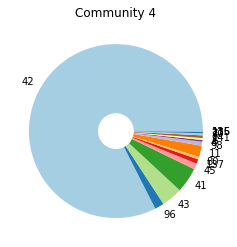

...

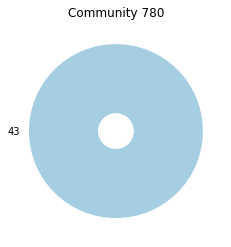

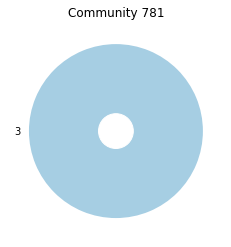

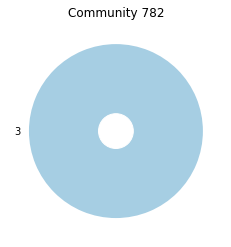

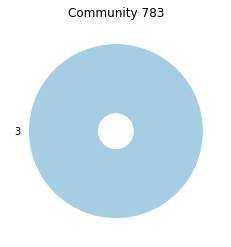

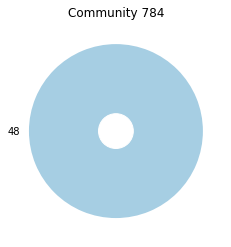

In [7]:
for i in range(len(coms_louv_tuple)):
    H = G.subgraph(coms_louv.communities[i])
    my_dict={}
    for item in H.edges().data():
        if len(list(item[2].values()))==2:
            settore= list(item[2].values())[1]
            if settore in my_dict.keys():
                my_dict[settore]+=1
            else:
                my_dict[settore]=1
    
    # create data
    names=my_dict.keys()
    size=my_dict.values()

    # Create a circle for the center of the plot
    my_circle=plt.Circle( (0,0), 0.2, color='white')

    from palettable.colorbrewer.qualitative import Paired_12
    plt.pie(size, labels=names, colors=Paired_12.hex_colors)
    p=plt.gcf()
    p.gca().add_artist(my_circle)
    plt.title('Community '+str(i))
    plt.show()

In [8]:
def draw_pie_chart(data, comm_title):
    fig, ax = plt.subplots(figsize=(12, 8), subplot_kw=dict(aspect="equal"))

    recipe = data


    data = [float(x.split()[0]) for x in recipe]
    ingredients = [x.split()[-1] for x in recipe]

    def func(pct, allvals):
        absolute = int(pct/100.*np.sum(allvals))
        #return "{:.1f}%".format(pct, absolute)
    #     return "{:.1f}%\n({:d} edges)".format(pct, absolute)

    wedges, autotexts = ax.pie(data,
                                      labels=ingredients,
                                      textprops=dict())

    #ax.legend(wedges, ingredients,
     #         title="Industries",
      #        loc="center left",
       #       prop={'size': 12},
        #      bbox_to_anchor=(1, 0, 0.5, 1), ncol=3)

    plt.setp(autotexts, size=13)

    ax.set_title('Community: ' + str(comm_title))

    plt.show()

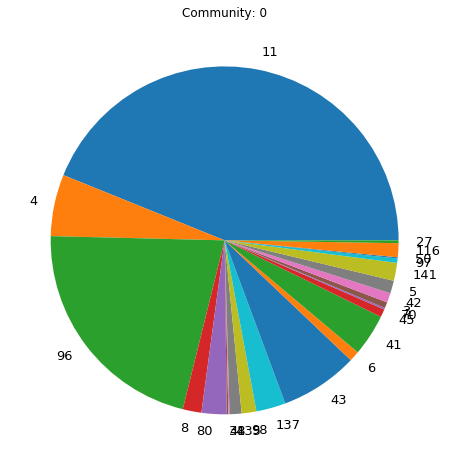

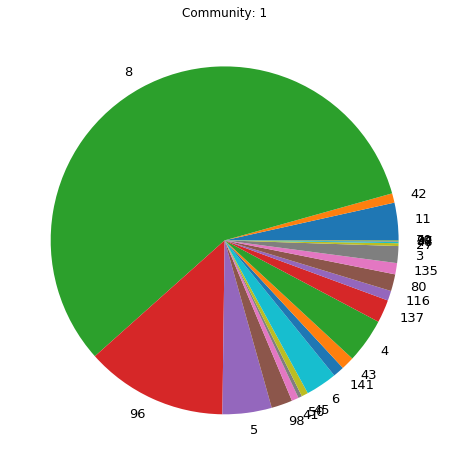

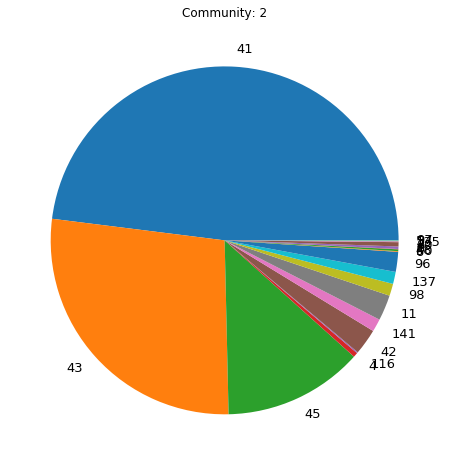

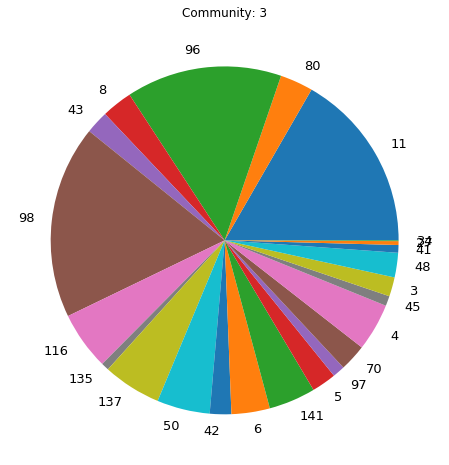

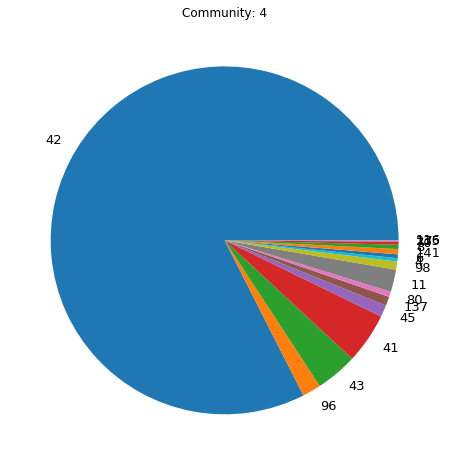

...

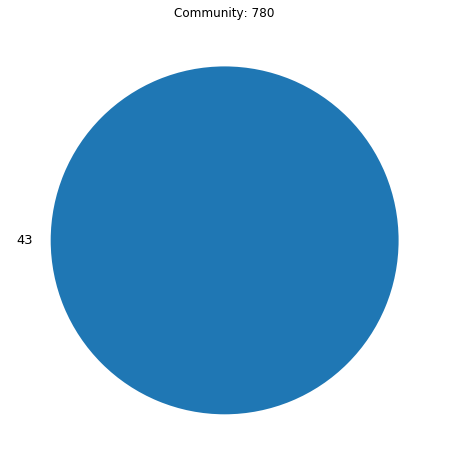

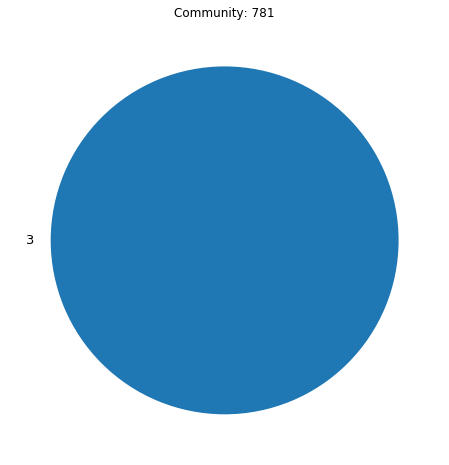

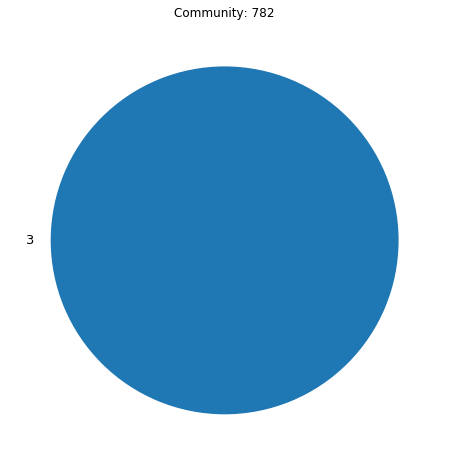

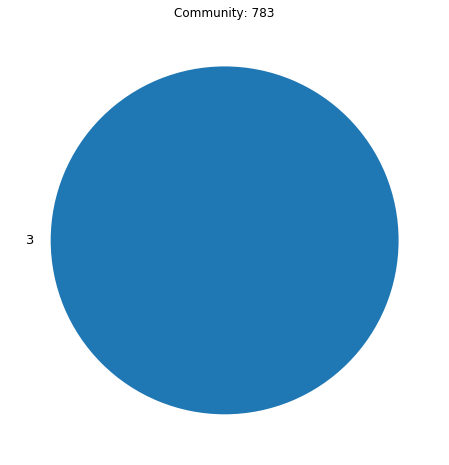

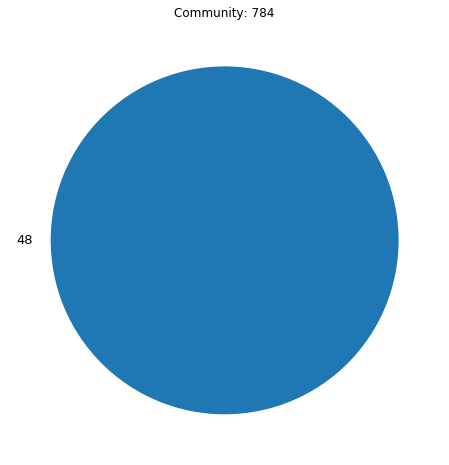

In [9]:
for i in range(len(coms_louv_tuple)):
    H = G.subgraph(coms_louv.communities[i])
    my_dict={}
    for item in H.edges().data():
        if len(list(item[2].values()))==2:
            settore= list(item[2].values())[1]
            if settore in my_dict.keys():
                my_dict[settore]+=1
            else:
                my_dict[settore]=1
    
    # create data
    names=my_dict.keys()
    size=my_dict.values()
    data=[]
    for j in range(len(names)):
        # settore - valore
        data.append(str(list(size)[j]) + ' - '+ str(list(names)[j])) 

    draw_pie_chart(data,i)

#  Settori

In [10]:
def draw_pie_chart_settori(data, comm_title):
    fig, ax = plt.subplots(figsize=(12, 8), subplot_kw=dict(aspect="equal"))

    recipe = data


    data = [float(x.split()[0]) for x in recipe]
    ingredients = [x.split()[-1] for x in recipe]

    def func(pct, allvals):
        absolute = int(pct/100.*np.sum(allvals))
        #return "{:.1f}%".format(pct, absolute)
    #     return "{:.1f}%\n({:d} edges)".format(pct, absolute)


    wedges,autotexts = ax.pie(data,
                                      textprops=dict(),labels=ingredients)

    plt.setp(autotexts, size=13)

    ax.set_title('Settore: ' + str(comm_title))

    plt.show()

In [11]:
lista=[]
for i in range(len(coms_louv_tuple)):
    H = G.subgraph(coms_louv.communities[i])
    my_dict={}
    for item in H.edges().data():
        if len(list(item[2].values()))==2:
            settore= list(item[2].values())[1]
            if settore in my_dict.keys():
                my_dict[settore]+=1
            else:
                my_dict[settore]=1
    lista.append(my_dict)


In [12]:
# Elenco settori
settori=[96,3,4,5,6,8,11,41,42,43,45,80,137,98,97,70,116,141,34,27,135,50,48]
# Dizionario conentente il dizionario di ogni settore
settori_dict={}

for item in settori:
    my_dict={}
    for pos, value in enumerate(lista):
        if item in value.keys():
            my_dict[pos]=value[item]
    settori_dict[item]=my_dict

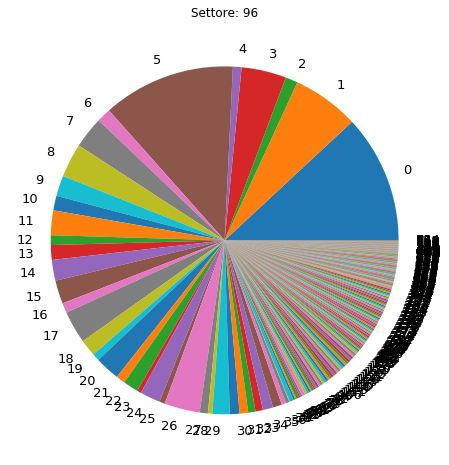

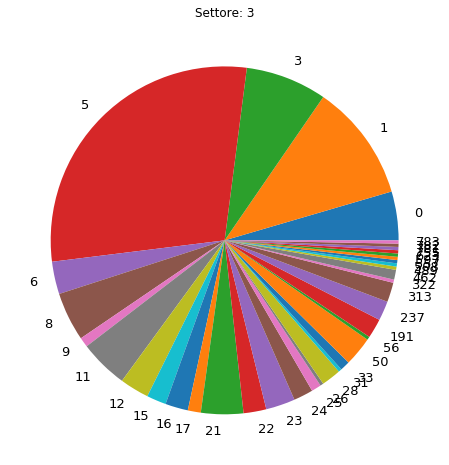

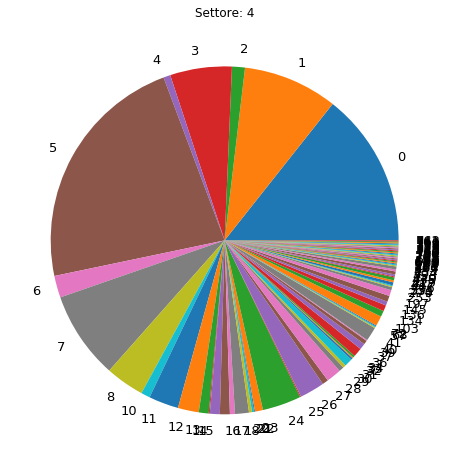

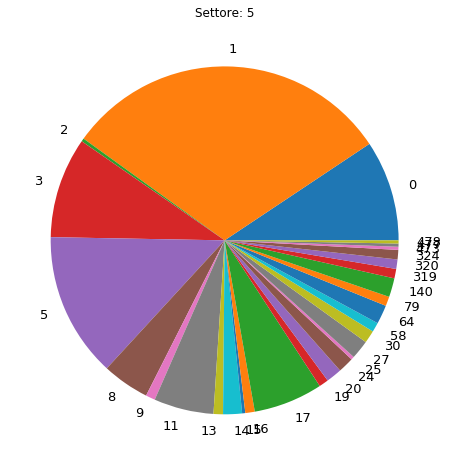

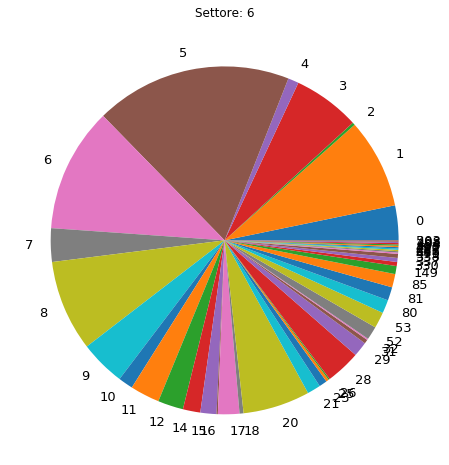

...

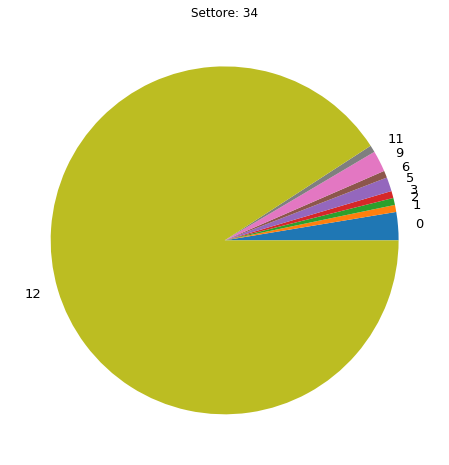

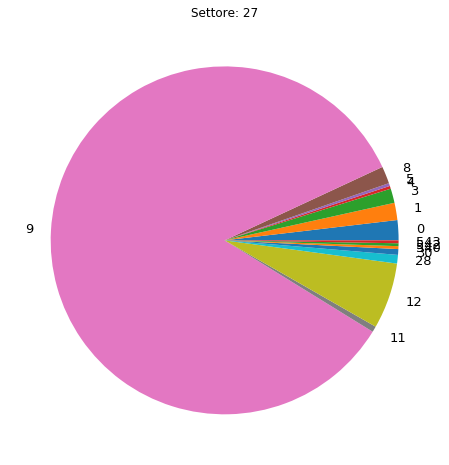

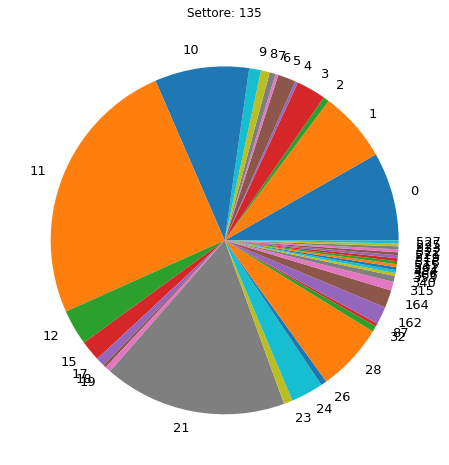

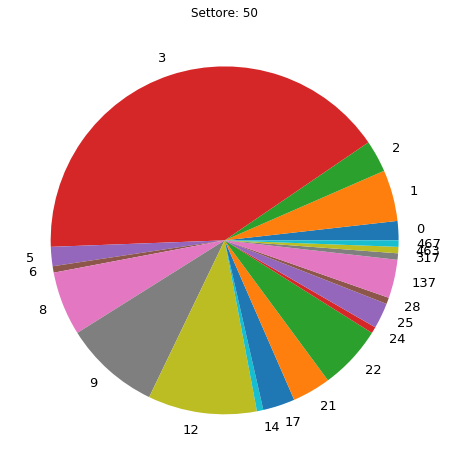

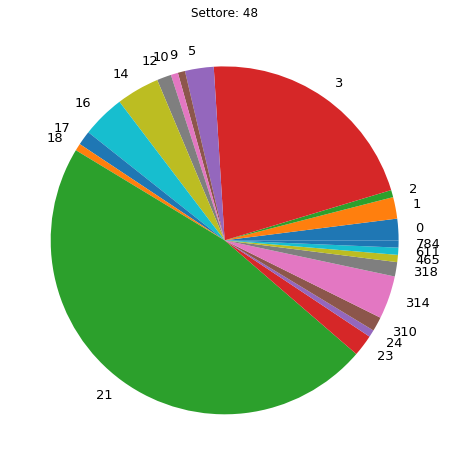

In [13]:
for item in settori:
    # create data
    # create data
    names=settori_dict[item].keys()
    size=settori_dict[item].values()
    data=[]
    for j in range(len(names)):
        # settore - valore
        data.append(str(list(size)[j]) + ' - '+ str(list(names)[j])) 

    draw_pie_chart_settori(data,item)

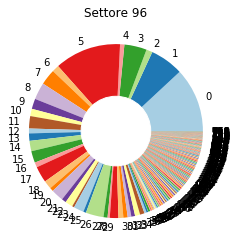

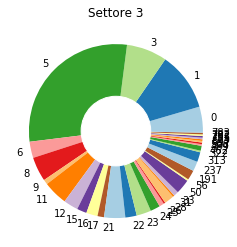

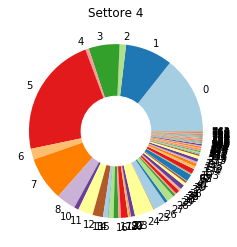

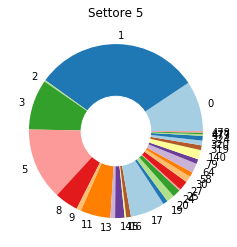

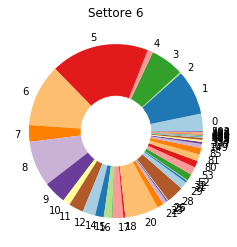

...

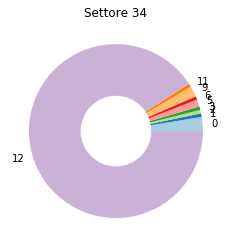

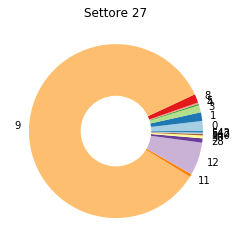

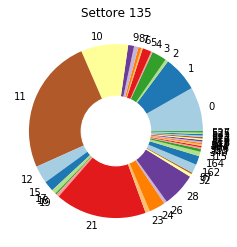

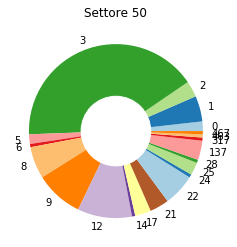

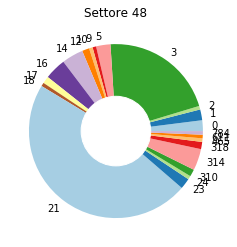

In [14]:
for item in settori:
    # create data
    names=settori_dict[item].keys()
    size=settori_dict[item].values()
    
    

    # Create a circle for the center of the plot
    my_circle=plt.Circle( (0,0), 0.4, color='white')

    from palettable.colorbrewer.qualitative import Paired_12
    plt.pie(size, labels=names, colors=Paired_12.hex_colors)
    p=plt.gcf()
    p.gca().add_artist(my_circle)
    plt.title('Settore '+str(item))
    plt.show()

<BarContainer object of 21 artists>

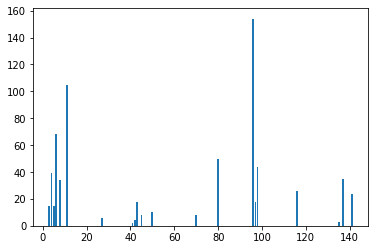

In [15]:
H = G.subgraph(coms_louv.communities[8])
my_dict={}
for item in H.edges().data():
    if len(list(item[2].values()))==2:
        settore= list(item[2].values())[1]
        if settore in my_dict.keys():
            my_dict[settore]+=1
        else:
            my_dict[settore]=1
# lista dei settori presenti nella community 7
#print(my_dict.values())

plt.bar(list(my_dict),my_dict.values())
#sorted(list(my_dict))

# Percentuali

In [16]:
perc_sett=[]
for i in range(len(coms_louv.communities)):
    my_dict={}
    H = G.subgraph(coms_louv.communities[i])
    print('Comm:',i)
    for item in H.edges().data():
        if len(list(item[2].values()))==2:
            settore= list(item[2].values())[1]
            if settore in my_dict.keys():
                my_dict[settore]+=1
            else:
                my_dict[settore]=1
    
    #print percentuale del settore maggiore nella communities i
    # percentuale calcolata come count più alto dei link con lo stesso settore
    # diviso per la cardinalotà dei link della community in analisi
    perc= max(my_dict.values())/len(H.edges().data())
    print(perc)
    perc_sett.append(perc)

Comm: 0
0.4388170055452865
Comm: 1
0.5724858511101437
Comm: 2
0.48018494055482164
Comm: 3
0.1796151104775481
Comm: 4
0.8247787610619469
Comm: 5
0.4040268456375839
Comm: 6
0.5935613682092555
Comm: 7
0.26549865229110514
Comm: 8
0.22448979591836735
Comm: 9
0.3695906432748538
Comm: 10
0.2564102564102564
Comm: 11
0.18855218855218855
Comm: 12
0.21786833855799373
Comm: 13
0.7300995024875622
Comm: 14
0.38924050632911394
Comm: 15
0.3153153153153153
Comm: 16
0.2936170212765957
Comm: 17
0.28823529411764703
Comm: 18
0.24364406779661016
Comm: 19
0.8358778625954199
Comm: 20
0.3163841807909605
Comm: 21
0.24738675958188153
Comm: 22
0.36503067484662577
Comm: 23
0.4594594594594595
Comm: 24
0.35797665369649806
Comm: 25
0.30656934306569344
Comm: 26
0.602996254681648
Comm: 27
0.3292181069958848
Comm: 28
0.1588235294117647
Comm: 29
0.42391304347826086
Comm: 30
0.23157894736842105
Comm: 31
0.38285714285714284
Comm: 32
0.25
Comm: 33
0.3252032520325203
Comm: 34
0.5411764705882353
Comm: 35
0.5942028985507246
Co

In [17]:
perc_sett

[0.4388170055452865,
 0.5724858511101437,
 0.48018494055482164,
 0.1796151104775481,
 0.8247787610619469,
 0.4040268456375839,
 0.5935613682092555,
 0.26549865229110514,
 0.22448979591836735,
 0.3695906432748538,
 0.2564102564102564,
 0.18855218855218855,
 0.21786833855799373,
 0.7300995024875622,
 0.38924050632911394,
 0.3153153153153153,
 0.2936170212765957,
 0.28823529411764703,
 0.24364406779661016,
 0.8358778625954199,
 0.3163841807909605,
 0.24738675958188153,
 0.36503067484662577,
 0.4594594594594595,
 0.35797665369649806,
 0.30656934306569344,
 0.602996254681648,
 0.3292181069958848,
 0.1588235294117647,
 0.42391304347826086,
 0.23157894736842105,
 0.38285714285714284,
 0.25,
 0.3252032520325203,
 0.5411764705882353,
 0.5942028985507246,
 0.5882352941176471,
 0.43243243243243246,
 0.2777777777777778,
 0.35294117647058826,
 0.3157894736842105,
 0.9333333333333333,
 0.9473684210526315,
 0.5882352941176471,
 0.8421052631578947,
 1.0,
 1.0,
 0.8421052631578947,
 0.5263157894736842,

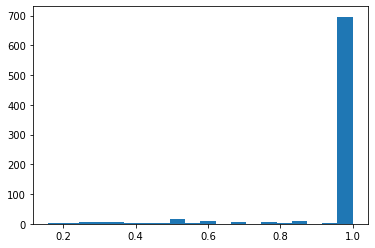

In [18]:
plt.hist(perc_sett,bins=20)
plt.show()